# Setting up the notebook

We begin by setting up the Jupyter notebook and importing the Python modules needed for plotting figures, create animations, etc. We include commands to view plots in the Jupyter notebook, and to create figures with good resolution and large labels. These commands can be customized to produce figures with other specifications.

In [1]:
# Imports python libraries
import numpy as np
import random as rd
import wave
import sys
import os
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
sys.path.insert(1, r'./../functions') # add to pythonpath

# commands to create high-resolution figures with large labels
%config InlineBackend.figure_formats = {'png', 'retina'} 
plt.rcParams['axes.labelsize'] = 16 # fontsize for figure labels
plt.rcParams['axes.titlesize'] = 18 # fontsize for figure titles
plt.rcParams['font.size'] = 14 # fontsize for figure numbers
plt.rcParams['lines.linewidth'] = 1.4 # line width for plotting

## Extracting and graphing the data

ECG recordings were obtained using the Backyard Brains Heart and Brain Spiker Box. The recordings are saved as audio files in .wav format. The first thing we have to do is open the .wav files and extract the data. We can extract the number of recording channels, sampling rate, etc.

In [2]:
#Function that extracts the number of recording channels, sampling rate, time and signal
#variable is the path and filename of the .wav file
def ecg(variable):
    record = wave.open(variable, 'r') # load the data

    # Get the number of channels, sample rate, etc.
    numChannels = record.getnchannels() #number of channels
    numFrames = record.getnframes() #number of frames
    sampleRate = record.getframerate() #sampling rate
    sampleWidth = record.getsampwidth()
    
    # Get wave data
    dstr = record.readframes(numFrames * numChannels)
    waveData = np.frombuffer(dstr, np.int16)

    # Get time window
    timeECG = np.linspace(0, len(waveData)/sampleRate, num=len(waveData))

    return timeECG, waveData

In [3]:
def graphic_fun(data_series, time_delays = [13, 125, 250, 1250], identifier = "xx"):
    time = time_delays[0]*0.1
    n = np.size(data_series)
    fig, axs = plt.subplots(2,2,figsize=(9,9))
    
    st = fig.suptitle(identifier, fontsize="x-large")
    axs[0, 0].plot(data_series[0: n-time_delays[0]], data_series[time_delays[0]: n],
              marker = "o", markersize = 0.05, linewidth = 0.005, color = "black")
    axs[0, 0].set_title(r"$t+"+str(time)+"ms$")
    axs[0, 0].set_xlabel(r"$x_n$")
    y = r'$x_{n+'+str(time)+"ms}$"
    axs[0, 0].set_ylabel(y)
    
    time = time_delays[1]*0.1
    axs[0, 1].plot(data_series[0: n-time_delays[1]], data_series[time_delays[1]: n],
              marker = "o", markersize = 0.05, linewidth = 0.005, color = "black")
    axs[0, 1].set_title(r"$t+"+str(time)+"ms$")
    axs[0, 1].set_xlabel(r"$x_n$")
    y = r'$x_{n+'+str(time)+"ms}$"
    axs[0, 1].set_ylabel(y)
    
    time = time_delays[2]*0.1
    axs[1, 0].plot(data_series[0: n-time_delays[2]], data_series[time_delays[2]: n],
              marker = "o", markersize = 0.05, linewidth = 0.005, color = "black")
    axs[1, 0].set_title(r"$t+"+str(time)+"ms$")
    axs[1, 0].set_xlabel(r"$x_n$")
    y = r'$x_{n+'+str(time)+"ms}$"
    axs[1, 0].set_ylabel(y)

    time = time_delays[3]*0.1
    axs[1, 1].plot(data_series[0: n-time_delays[3]], data_series[time_delays[3]: n],
              marker = "o", markersize = 0.05, linewidth = 0.005, color = "black")
    axs[1, 1].set_title(r"$t+"+str(time)+"ms$")
    axs[1, 1].set_xlabel(r"$x_n$")
    y = r'$x_{n+'+str(time)+"ms}$"
    axs[1, 1].set_ylabel(y)

    #Shifts down the subplots
    fig.tight_layout()
    st.set_y(0.85)
    fig.subplots_adjust(top=0.8)
    return None

In [4]:
def detecta_maximos_locales(timeECG, waveData, threshold_ratio=0.7):
    # If not all the R peaks are detected, lower the threshold_ratio
    # If components that are not R peaks (like T waves) are detected, higher the threshold_ratio

    if len(timeECG) != len(waveData): #Raises an error if the two arrays have different lengths
        raise Exception("The two arrays have different lengths.")
    
    interval = max(waveData) - min(waveData)
    threshold = threshold_ratio*interval + min(waveData)
    maxima = []
    maxima_indices = []
    mxs_indices = []
    banner = False
    
    for i in range(0, len(waveData)):
            
        if waveData[i] >= threshold:#If a threshold value is surpassed,
            # the indices and values are saved 
            banner = True
            maxima_indices.append(i)
            maxima.append(waveData[i])
            
        elif banner == True and waveData[i] < threshold: #If the threshold value is crossed
            # the index of the maximum value in the original array is saved
            index_local_max = maxima.index(max(maxima))
            mxs_indices.append(maxima_indices[index_local_max])
            maxima = []
            maxima_indices = []
            banner = False     

    return mxs_indices

In [5]:
# If the input of this function is time, the intervals will be given in those same units
# Obtaining the indexes at which the R peaks occur.
def R_intervals(time_indices):
    length = len(time_indices)
    intervals = np.zeros(length-1)
    
    for i in range(0, length-1):
        intervals[i] = time_indices[i+1]-time_indices[i]
    
    return intervals

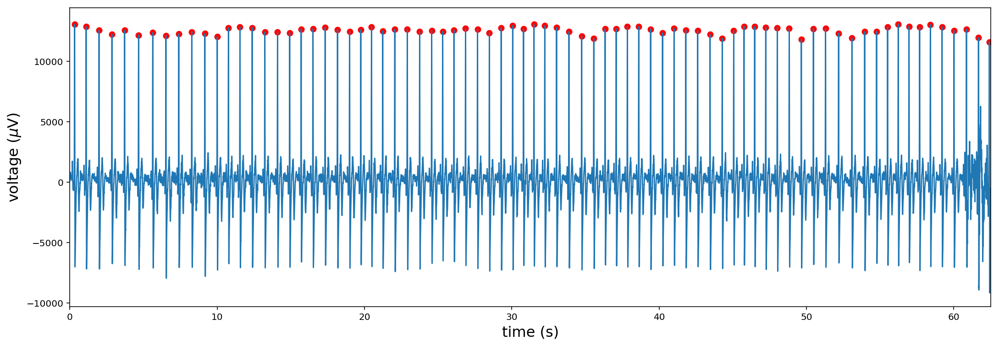

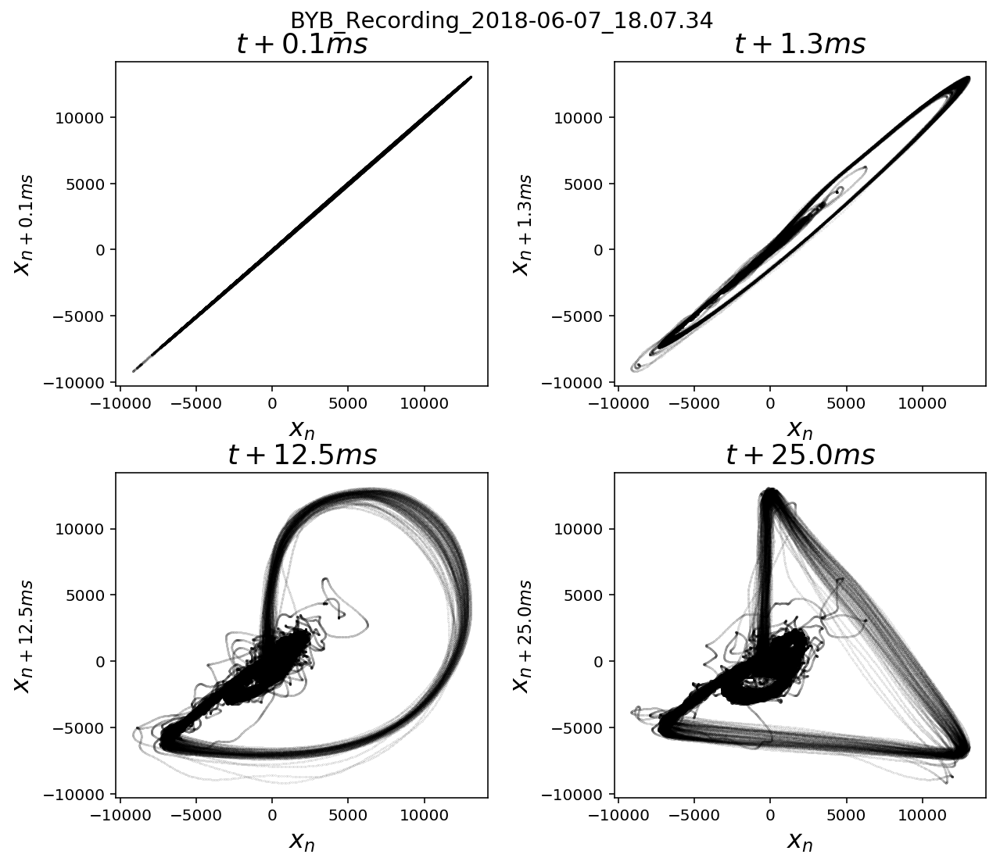

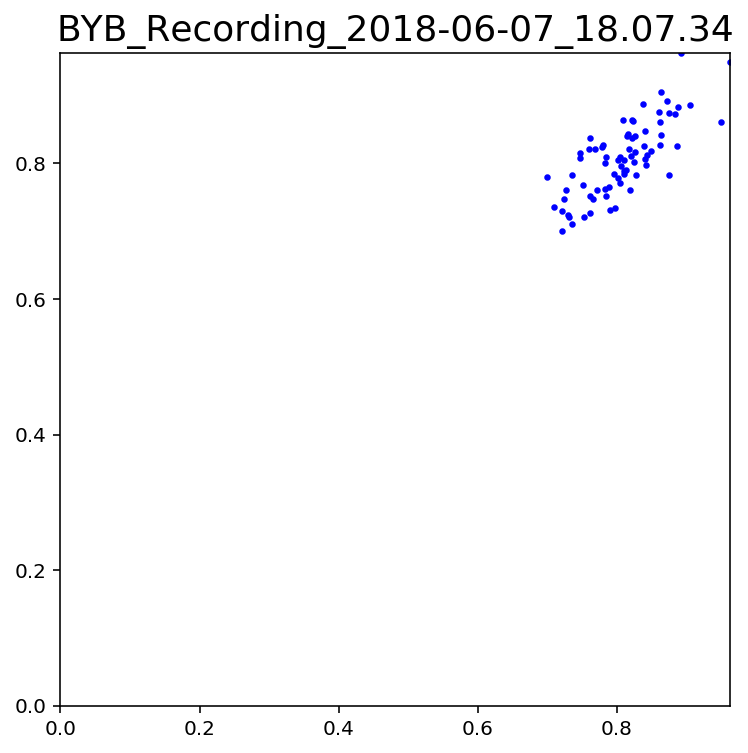

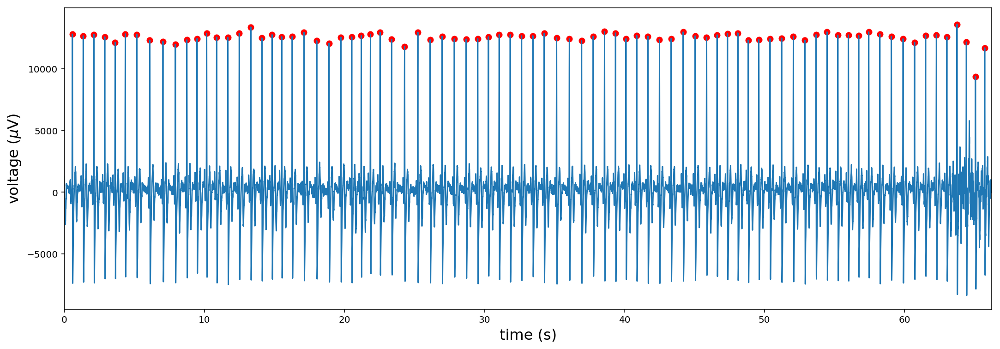

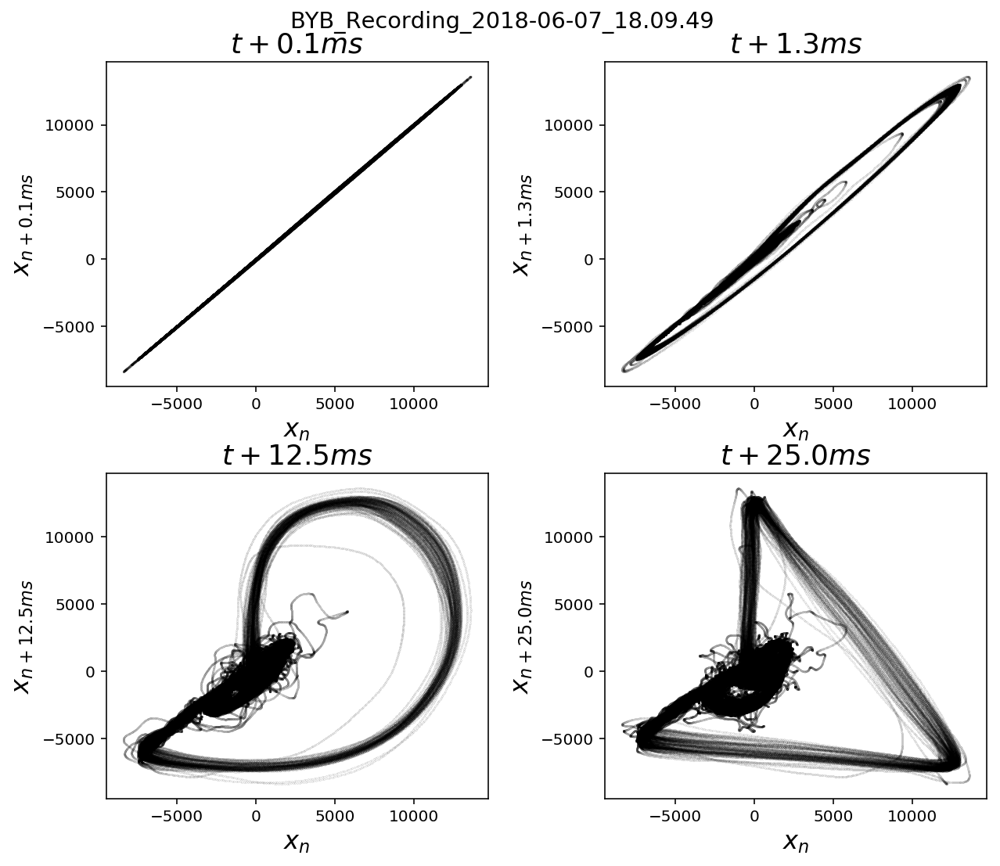

...

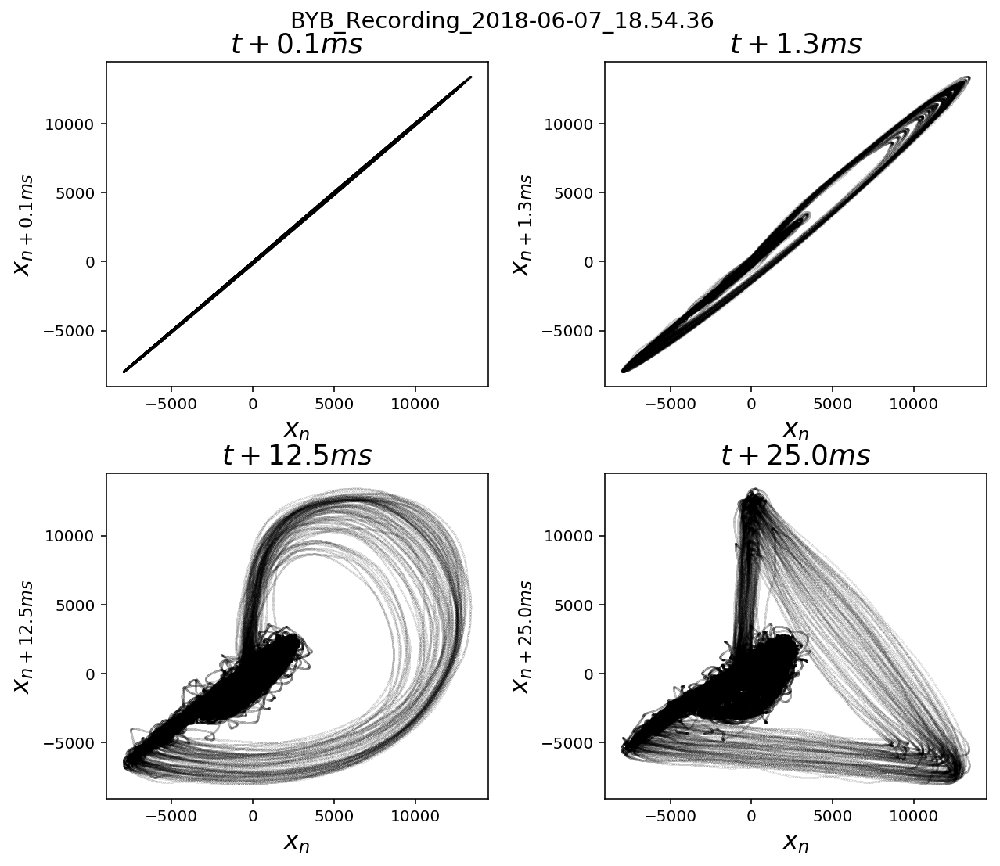

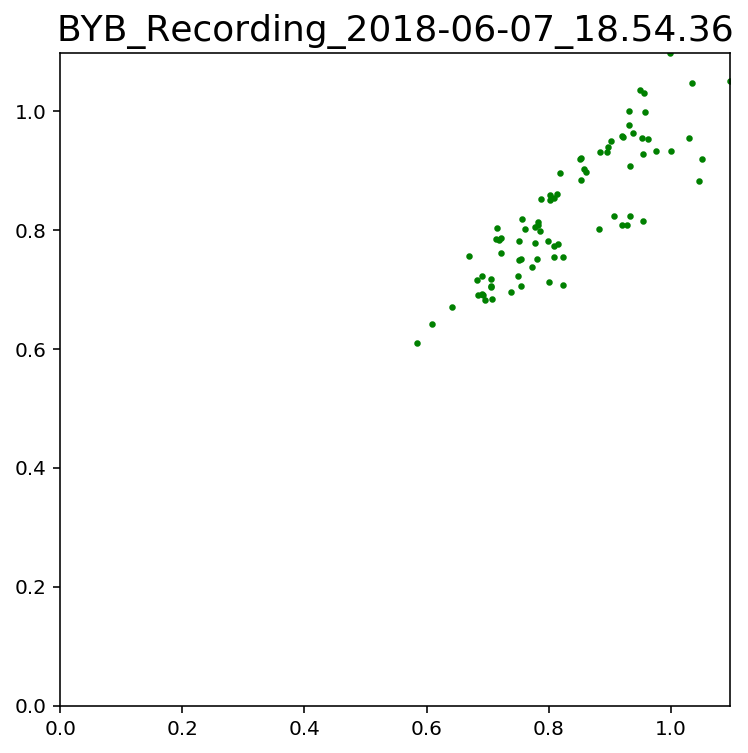

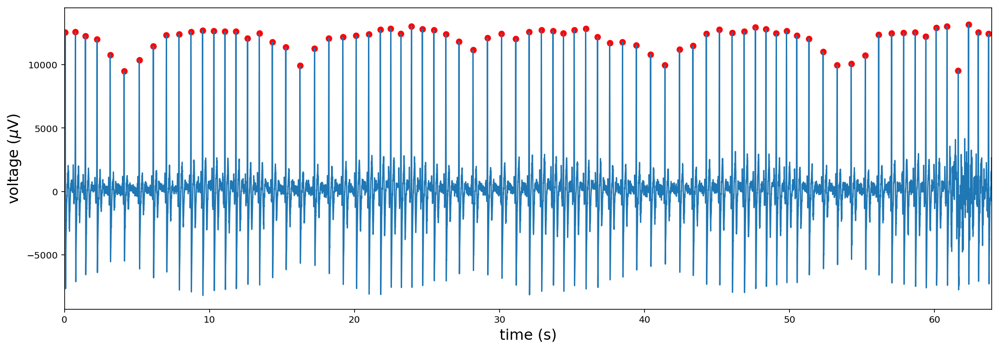

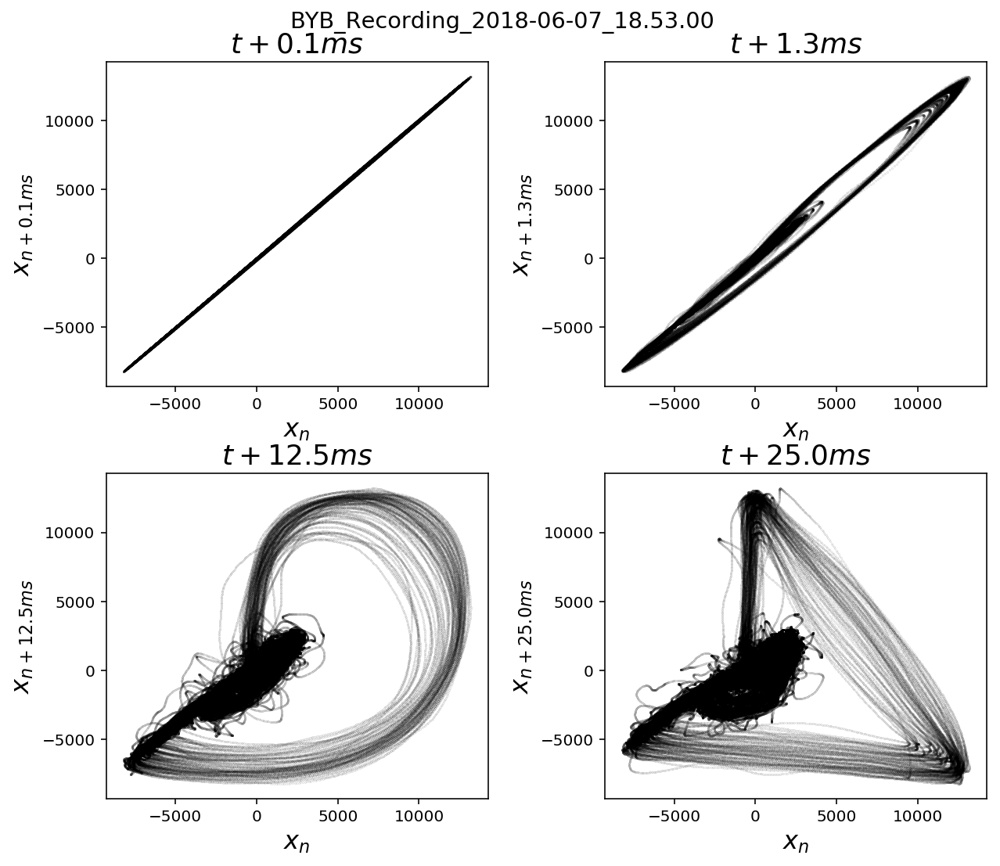

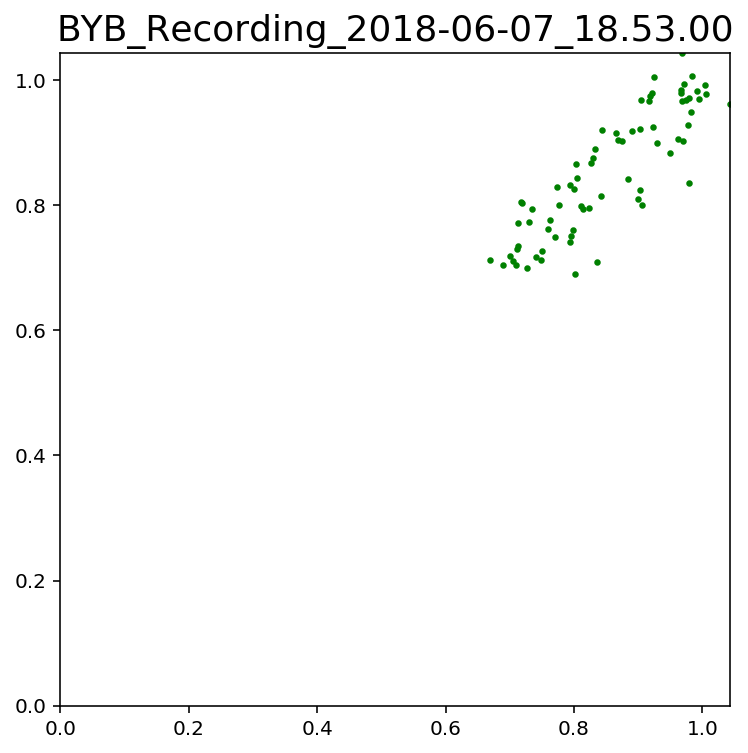

IndexError: list index out of range

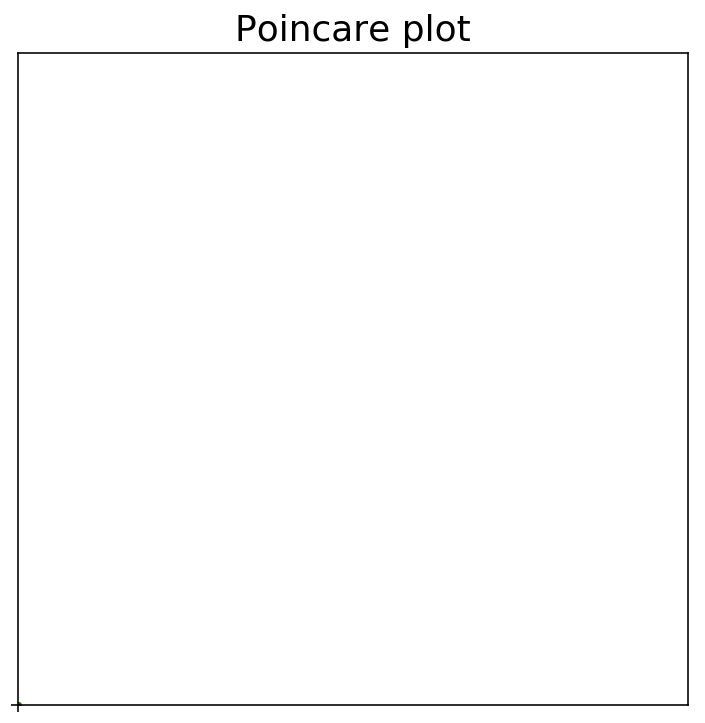

In [6]:
# http://gis.humboldt.edu/OLM/Courses/GSP_318/08_1_BatchProcessinWithArcGIS.html

# set the input to the path where the original files are
InputPaths = ["ECG_registros_meditacion/1.- Control/",
            "ECG_registros_meditacion/2.- Aguantando la respiración pecho/",
            "ECG_registros_meditacion/3.- Respiraciones profundas 55 pecho/",
            "ECG_registros_meditacion/4.- Aguantando la respiración abdomen/",
            "ECG_registros_meditacion/5.- Respiraciones profundas 55 abdomen/",
            "ECG_registros_meditacion/6.- Respiración en ola/"]

colors = ['blue', 'red', 'black', 'purple', "orange","green"]
poincare_array1 = []
poincare_array2 = []
poincare_array3 = []
poincare_array4 = []
poincare_array5 = []
poincare_array6 = []

#Notice that the files you want to read must be in folders inside the folder where this notebook is
for i in range(0, len(InputPaths)):
    
    InputPath = InputPaths[i]
    
    TheList = os.listdir(InputPath)

    for TheFile in TheList:
        # break up the file name into pieces based on periods
        TheFileName, TheFileExtension = os.path.splitext(TheFile)

        # create the full path to the file
        InputFilePath=InputPath+TheFileName+TheFileExtension
        # determine if this is a file (name and extension), and the extension is "wav"
        if (TheFileExtension==".wav"):

            #Procesamiento que ya habiamos hecho
            timeECG,waveData = ecg(InputFilePath)

            #Detects R peaks
            mxs_indices = detecta_maximos_locales(timeECG, waveData)

            #Plots R peaks and ECG signal
            plt.figure(figsize=(18,6))
            plt.xlabel(r'time (s)')
            plt.ylabel(r'voltage ($\mu$V)')
            plt.xlim(min(timeECG),max(timeECG))
            plt.plot(timeECG, waveData)
            plt.scatter(timeECG[mxs_indices], waveData[mxs_indices], color='r')
            plt.show()

            #Phase space reconstruction
            time_delays = [1, 13, 125, 250]
            graphic_fun(waveData, time_delays, TheFileName)


            xx = R_intervals(timeECG[mxs_indices])
            if i == 0:
                poincare_array1.append(xx)
            elif i == 1:
                poincare_array2.append(xx)
            elif i == 2:
                poincare_array3.append(xx)
            elif i == 3:
                poincare_array4.append(xx)
            elif i == 4:
                poincare_array5.append(xx)
            elif i == 5:
                poincare_array6.append(xx)

            #Poincare plot
            plt.figure(figsize=(6,6))
            plt.scatter(xx[1:-1], xx[:-2], s = 5, c = colors[i], label = TheFileName)
            plt.title(TheFileName)
            plt.xlim(0,max(xx))
            plt.ylim(0,max(xx))
            plt.show()

            
#Poincare plots of all the values
plt.figure(figsize=(6,6))
plt.title("Poincare plot")
for j in range(0, len(InputPaths)):
    poincare_arrays = "poincare_array"+str(j)
    for i in range(0, len(poincare_arrays)):
        xx = poincare_arrays[i]

        plt.scatter(xx[1:-1], xx[:-2], s = 5, c = colors[i], label = j)
        plt.xlim(0,1)
        plt.ylim(0,1)
plt.legend()
plt.show()

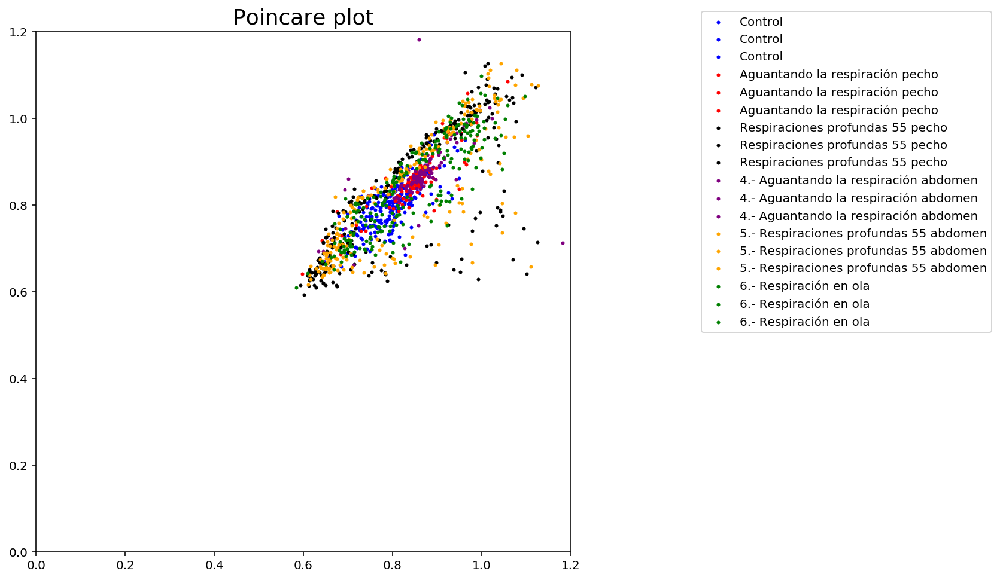

In [7]:
# Poincare plots

colors = ['blue', 'red', 'black', 'purple', "orange","green"]
identifiers = ["Control", "Aguantando la respiración pecho", "Respiraciones profundas 55 pecho",
"4.- Aguantando la respiración abdomen", "5.- Respiraciones profundas 55 abdomen", "6.- Respiración en ola"]
    
#Poincare plots of all the values
plt.figure(figsize=(8,8))
plt.title("Poincare plot")
plt.xlim(0,1.2)
plt.ylim(0,1.2)

for j in range(0, len(InputPaths)):
    if j == 0:
        poincare_arrays = poincare_array1
    elif j == 1:
        poincare_arrays = poincare_array2
    elif j == 2:
        poincare_arrays = poincare_array3
    elif j == 3:
        poincare_arrays = poincare_array4
    elif j == 4:
        poincare_arrays = poincare_array5
    elif j == 5:
        poincare_arrays = poincare_array6
    
    for i in range(0, len(poincare_arrays)):

        xx = poincare_arrays[i]

        plt.scatter(xx[1:-1], xx[:-2], s = 4, c = colors[j], label = identifiers[j])
        
plt.legend(loc='upper right', bbox_to_anchor=(1.8, 1.05))
plt.show()

En las siguientes celdas hay un problema con los colores y la leyenda

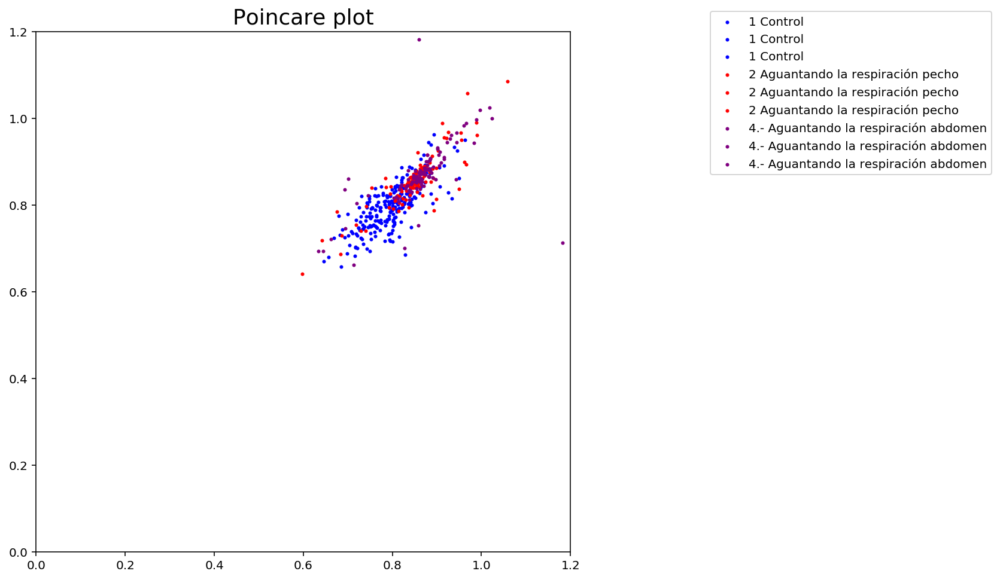

In [8]:
# Poincare plots

colors = ['blue', 'red', 'black', 'purple', "orange","green"]
identifiers = ["1 Control", "2 Aguantando la respiración pecho", "3 Respiraciones profundas 55 pecho",
"4.- Aguantando la respiración abdomen", "5.- Respiraciones profundas 55 abdomen", "6.- Respiración en ola"]
    
#Poincare plots of all the values
plt.figure(figsize=(8,8))
plt.title("Poincare plot")
plt.xlim(0,1.2)
plt.ylim(0,1.2)

for j in range(0, len(InputPaths)):
    if j == 0:
        poincare_arrays = poincare_array1
    elif j == 1:
        poincare_arrays = poincare_array2
#     elif j == 2:
#         poincare_arrays = poincare_array3
    elif j == 3:
        poincare_arrays = poincare_array4
#     elif j == 4:
#         poincare_arrays = poincare_array5
#     elif j == 5:
#         poincare_arrays = poincare_array6
    if poincare_arrays != []:
        for i in range(0, len(poincare_arrays)):

            xx = poincare_arrays[i]

            plt.scatter(xx[1:-1], xx[:-2], s = 4, c = colors[j], label = identifiers[j])
        poincare_arrays = []
        
plt.legend(loc='upper right', bbox_to_anchor=(1.8, 1.05))
plt.show()

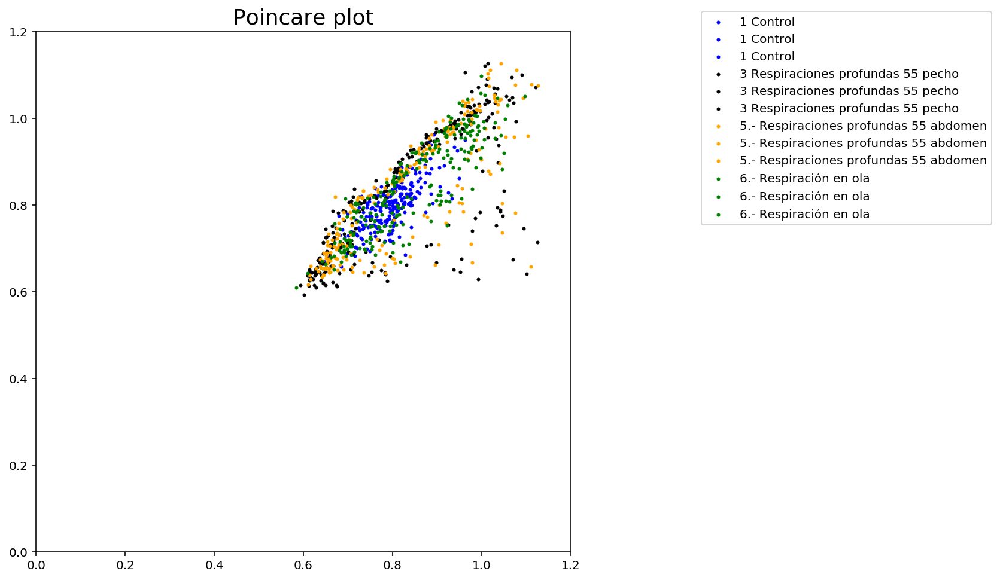

In [9]:
# Poincare plots

colors = ['blue', 'red', 'black', 'purple', "orange","green"]
identifiers = ["1 Control", "2 Aguantando la respiración pecho", "3 Respiraciones profundas 55 pecho",
"4.- Aguantando la respiración abdomen", "5.- Respiraciones profundas 55 abdomen", "6.- Respiración en ola"]
    
#Poincare plots of all the values
plt.figure(figsize=(8,8))
plt.title("Poincare plot")
plt.xlim(0,1.2)
plt.ylim(0,1.2)

for j in range(0, len(InputPaths)):
    if j == 0:
        poincare_arrays = poincare_array1
#     elif j == 1:
#         poincare_arrays = poincare_array2
    elif j == 2:
        poincare_arrays = poincare_array3
#     elif j == 3:
#         poincare_arrays = poincare_array4
    elif j == 4:
        poincare_arrays = poincare_array5
    elif j == 5:
        poincare_arrays = poincare_array6
    
    if poincare_arrays != []:
        for i in range(0, len(poincare_arrays)):

            xx = poincare_arrays[i]

            plt.scatter(xx[1:-1], xx[:-2], s = 4, c = colors[j], label = identifiers[j])
        poincare_arrays = []
        
plt.legend(loc='upper right', bbox_to_anchor=(1.8, 1.05))
plt.show()

Techniques 3, 5 and 6 make the R R intervals change. Very interesting what happens to the heartbeat while meditating!

Interpretación: Al someter al cuerpo bajo un esfuerzo físico, los intervalos R-R Se vuelven más regulares y el corazón comienza a asemejarse a un reloj. Tanto sus intervalos entre latidos se vuelven más regulares y aumenta la frecuencia de los picos R.

Sin embargo, si nos enfocamos en el comportamiento de la onda completa después de hacer ejercicio, se observa que la correlación entre un punto de la señal y la siguiente no es tan semejante que cuando se está en reposo. La idea de que las trayectorias "spread out" en el espacio fase.